<a href="https://www.kaggle.com/code/leonanvasconcelos/coloring-cctv-images-using-cnn?scriptVersionId=164845988" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Coloring CCTV Images Using CNN

<br/>
<strong>Author:</strong> Leonan Felipe de Souza Vasconcelos
<br/>
<strong>Date:</strong> February, 28th 2024
<p>

This notebook showcases the training of a Convolutional Neural Network (CNN) tailored for colorizing images captured by CCTV cameras. The CNN is specifically trained for the camera's location, outperforming generic AI models in terms of accuracy. Consequently, grayscale images recorded at night using the camera's infrared feature can be colorized to reveal the original colors of objects or even individuals with remarkable precision.

# Basic Steps

<h3>1. Frame Extraction from Video</h3>
The process begins by reading a video file and extracting each frame as a separate image. This step is crucial for preparing the dataset required for training the CNN.
<h3>2. Color Space Conversion (RGB to LAB)</h3>
<p>To optimize dataset size and enhance training performance, the color space of the images is converted from RGB to LAB. This conversion is strategically chosen to ensure that while the shape of objects remains constant, their color can be dynamically adjusted. The LAB color space is particularly suited for this task as it separates luminance (lightness) from color information, facilitating more effective colorization without altering object geometry.</p>
<h3>3. CNN Training for Color Prediction:</h3>
<p>The core of this notebook is the development and training of a Convolutional Neural Network (CNN) to accurately predict the colors of grayscale images. A specific CNN architecture is created from scratch for this purpose; we did not utilize an existing model. This bespoke approach allows for tailored optimization to the unique characteristics of the CCTV footage, focusing on precise colorization tasks. The CNN's architecture is meticulously designed to capture and interpret the complex patterns necessary for accurate color prediction.</p>

<h1>Key enhancements</h1>

<h3>Precision in Colorization:</h3>
<p>The CNN's training is finely tuned to the specific environment captured by the CCTV, enabling it to colorize nighttime grayscale images with high fidelity. Given the critical importance of accuracy in security applications, fidelity in colorization is paramount. The algorithm is designed not to invent colors arbitrarily; instead, it aims to preserve the grayscale values when an object is unknown or uncertain, ensuring that any colorization strictly adheres to realistic and plausible outcomes. This careful approach ensures that the colorized images are not only visually appealing but also accurate representations of the scene as it would appear in natural light, which is crucial for maintaining the integrity of security footage.</p>
<h3>Efficiency and Performance:</h3>
<p>By converting images to the LAB color space, the notebook demonstrates an innovative strategy to reduce the computational load, thereby enhancing efficiency and performance. The LAB color space is particularly advantageous because it allows for the reduction of input/output data during the model's training and inference phases. Specifically, the input to the model consists only of the L channel (lightness), which represents the grayscale information. The model then predicts the two color channels, A and B, which encode color information, instead of having to process and predict the three channels (R, G, and B) typical of RGB color space. This reduction in the dimensionality of both input and output data significantly streamlines the computation process, resulting in faster training times and more efficient performance without compromising the accuracy of color predictions.
<li><strong>Performance</strong>: Achieved a remarkable efficiency of colorizing 9.31 frames per second.</li>
</p>

<h3>Dual-Channel Input for Enhanced Feature Capture:</h3>
<p>To capture a comprehensive range of features from the input images, our CNN utilizes a dual-channel approach. The first channel processes the original grayscale images derived from the L channel of the LAB color space, focusing on global features. The second channel, meanwhile, handles the L channel images transformed by the CLAHE method, which enhances local contrast and highlights subtle details often missed in standard grayscale conversion. This innovative dual-input strategy ensures that the CNN benefits from both a broad perspective of the image and a detailed understanding of specific features, significantly improving the accuracy and reliability of color prediction.</p>

# Configurations

In [1]:
#PATHS
PATH_LOCAL = r"/kaggle/working/"
INPUT_FILE = r"/kaggle/input/cctv-video/despacho1.mp4"
#PATH_LOCAL = r"./"
#INPUT_FILE = r"./despacho1.mp4"


PICKLE_CACHE = f"{PATH_LOCAL}cache.pkl"

MODEL_NAME = "model_LAB_CLAHE"

# Defining the size of the image in pixels
IMAGE_SIZE_HEIGHT, IMAGE_SIZE_WIDTH =   768, 1152
TILE_SHAPE = (2, 4)
NUM_RANDOM_TILES = 3
TILES_PER_IMAGE = TILE_SHAPE[0]*TILE_SHAPE[1] # Calculated
SIMILARITY_THRESHOLD = 95

# Model parameters
PATIENCE = 30
EPOCHS = 150
TEST_TRAIN_RATE = 0.2

# Performance parameters
CLEAN_CACHE = True           #False=read images from local cache    True=read from original files again
DISPLAY_SAMPLE = 60          #limit number of images saved in sample video
MAX_FRAMES = 200              #limit number of frames to be extracted from video

# Fix seeds to get predicable results
seed = 9396

# Validate configurable dimensions
ideal_height = (IMAGE_SIZE_HEIGHT // 32 * 32)
ideal_width = (IMAGE_SIZE_HEIGHT / 0.625) // 32 * 32

ideal_height = int(ideal_height // TILE_SHAPE[0] // 32 * 32 * TILE_SHAPE[0])
ideal_width = int(ideal_width // TILE_SHAPE[1] // 32 * 32 * TILE_SHAPE[1])

if ( IMAGE_SIZE_HEIGHT % 32 != 0):
    raise Exception(f"IMAGE_SIZE_HEIGHT must be multiple of 32. Suggestion: {ideal_height}x{ideal_width}px")
if ( IMAGE_SIZE_WIDTH % 32 != 0):
    raise Exception(f"IMAGE_SIZE_WIDTH must be multiple of 32. Suggestion: {ideal_height}x{ideal_width}px")
if ( (IMAGE_SIZE_HEIGHT / TILE_SHAPE[0]) % 32 != 0):
    raise Exception(f"IMAGE_SIZE_HEIGHT/TILE_SHAPE must be multiple of 32. Suggestion: {ideal_height}x{ideal_width}px")
if ( (IMAGE_SIZE_WIDTH / TILE_SHAPE[1]) % 32 != 0):
    raise Exception(f"IMAGE_SIZE_WIDTH/TILE_SHAPE must be multiple of 32. Suggestion: {ideal_height}x{ideal_width}px")

## Requirements

<ul>
<li><strong>Parallel Processing</strong>: Utilized <code>concurrent.futures.ThreadPoolExecutor</code> for efficient parallel processing, significantly speeding up data preparation and model training phases.</li>
<li><strong>ABC Color Space</strong>: Converted images from RGB to ABC to isolate luminance from color information, pivotal for dynamic color adjustment without affecting object geometry using <code>skimage.color</code>.</li>
<li><strong>CLAHE Enhancement</strong>: Applied Contrast Limited Adaptive Histogram Equalization (CLAHE) via the <code>cv2</code> library to improve characteristics of grayscale images.</li>
<li><strong>Skimage Library</strong>: Employed <code>skimage</code> for color space conversion, creating montages for visual comparison, and dataset splitting.</li>
<li><strong>Pandas for Analysis</strong>: Used the <code>pandas</code> library to prepare training charts for detailed performance analysis.</li>
<li><strong>Keras CNN</strong>: Built the CNN using the <code>keras</code> library, with a custom architecture designed for CCTV footage colorization.</li>
<li><strong>Keras Callbacks</strong>: Utilized <code>keras.callbacks</code> for early stopping, halting training once the model ceased to improve.</li>
<li><strong>Image Manipulation</strong>: Used Open CV2 <code>cv2</code> played a vital role in preprocessing and enhancing steps through image matrix manipulation.</li>
<li><strong>NumPy for Image Matrix Processing</strong>: Leveraged <code>numpy</code> for efficient manipulation and processing of image matrices, fundamental to the project's success.</li>
<li><strong>Custom Cache System</strong>: Implemented a custom cache with <code>shutil, pickle, os</code> to save intermediary steps, reducing redundancy and enhancing efficiency.</li>
<li><strong>Presentation in Notebook</strong>: Used <code>IPython.display</code> within Jupyter Notebook for engaging result visualization using HTML.</li>
<li><strong>CNN Diagram</strong>: Used <code>visualkeras</code> for display CNN diagram.</li>

In [2]:
# Install necessary libraries
#%pip install tensorflow keras

# Parallel processing
from concurrent.futures import ThreadPoolExecutor

# CNN architecture and utilities
from keras import callbacks, layers
from keras.layers import Conv2D, UpSampling2D, InputLayer, Activation, Conv2DTranspose
from keras.initializers import RandomNormal
from keras.models import Sequential

import tensorflow as tf
from tensorflow.keras.utils import array_to_img, img_to_array, load_img, set_random_seed
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
tf.compat.v1.disable_v2_behavior()

# Image manipulation and color space conversion
from skimage.color import rgb2lab, lab2rgb
from skimage.io import imshow, imsave
from skimage.util import montage
from sklearn.model_selection import train_test_split
from skimage.metrics import structural_similarity as ssim
import cv2

# Data handling and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.font_manager import findSystemFonts
from IPython.display import HTML
from PIL import Image, ImageFont, ImageDraw
from base64 import b64encode

# File and directory handling
import pickle
import os
import shutil
from glob import glob
from pathlib import Path
from tqdm import tqdm

# Set random seed for reproducibility
set_random_seed(seed)
np.random.seed(seed)

# Handling CUDA registration errors
# The errors regarding cuDNN, cuFFT, and cuBLAS factory registration are typically related to TensorFlow's internal handling of CUDA resources.
# These errors usually don't prevent the TensorFlow operations from executing unless they specifically cause a failure in your application's context.

2024-02-29 11:31:38.646858: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-29 11:31:38.647041: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-29 11:31:38.790379: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Utils

In [3]:
# ---- Display Functions

def show_loss_accuracy_evolution(history):
    """
    Display a chart representing the training evolution, including both loss and accuracy over epoch.
    
    Parameters:
    - history: A dictionary containing the training history. This history includes metrics such as loss and accuracy
               for both training and validation phases.
    """
    # Setup the plotting area: 1 row, 2 columns with a fixed size
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Epoch will be used as the X-axis labels
    epoch = history.index
    
    # Plot training and validation loss
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Categorical Crossentropy')
    ax1.plot(epoch, history['loss'], label='Training Loss')
    ax1.plot(epoch, history['val_loss'], label='Validation Loss')
    # Dynamically set the Y-axis limit for loss plot
    ax1.set_ylim([0, max(history['val_loss'][:max(1,len(history['val_loss']) // 10)])])
    ax1.grid()
    ax1.legend()
    
    # Plot training and validation accuracy
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(epoch, history['acc'], label='Training Accuracy')
    ax2.plot(epoch, history['val_acc'], label='Validation Accuracy')
    # Fix the Y-axis limit for accuracy plot between 0 and 1
    ax2.set_ylim([0, 1])
    ax2.grid()
    ax2.legend()
    
    # Display the plot
    plt.show()


def resize_image(image, max_resolution=700, downscale_factor=0):
    """
    Resizes an image while maintaining the aspect ratio. If a downscale factor is provided, it takes precedence over
    the max_resolution parameter.

    Parameters:
    - image: ndarray, the image to be resized.
    - max_resolution: int, the maximum size for the longest dimension of the image. Default is 700.
    - downscale_factor: float, factor by which the image dimensions are divided. Default is 0.

    Returns:
    - resized_image: ndarray, the resized image.
    - scaling_factor: float, the factor by which the image was scaled.
    """
    # Extract the dimensions of the original image
    height, width = image.shape[:2]

    # Calculate the scaling factor
    if downscale_factor > 0:
        scaling_factor = 1 / downscale_factor
    elif max_resolution > 0:
        scaling_factor = min(max_resolution / max(height, width), 1)  # Ensure scaling factor does not exceed 1
    else:
        scaling_factor = 1

    # Calculate the new dimensions
    new_height, new_width = int(height * scaling_factor), int(width * scaling_factor)

    resized_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)

    return resized_image, scaling_factor



def show_images(*images, titles=[], figsize=8, max_resolution=400):
    """
    Displays images in a single row of subplots with optional titles and labels reflecting the original image size.

    Args:
        *images: A sequence of images to display. Can be either numpy arrays or string paths to the images.
        titles: A list of titles for each image. Default is None.
        figsize: Size of the figure for displaying the images.
        max_resolution: The maximum resolution to be displayed.

    Returns:
        None
    """
    plt.figure(figsize=(figsize * len(images), figsize))
    

    for i, name_or_image in enumerate(images):

        # If the input is a string, assume it's a path to an image
        if isinstance(name_or_image, str):
            image = cv2.imread(name_or_image)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = np.array(image)
        else:
            if not(isinstance(name_or_image[...,0], np.uint8)):
                name_or_image = np.array(name_or_image, dtype=np.uint8)

            image = name_or_image

        height, width = image.shape[:2]

        # Skip images with invalid dimensions
        if height <= 0 or width <= 0:
            continue

        # Convert shape (3, 4, 1) to (3, 4)
        if image.ndim == 3:
            channels = image.shape[2]
            if channels == 1:
                image = np.squeeze(image, axis=-1)

        # If the image is grayscale, convert it to RGB
        if image.ndim == 2:
            image = np.stack((image,) * 3, axis=-1)
        
        # Resize the image if it exceeds the maximum resolution
        image, scaling_factor = resize_image(image, max_resolution)

        # Create a subplot for the image
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(image)

        # Set the title of the subplot
        title = titles[i] if titles else f"Image {i + 1}"
        ax.set_title(f"{title}", fontsize=20) 
        plt.text(0.5, -0.1, f"{width}x{height}px", ha='center', va='top', transform=plt.gca().transAxes)

        # Update tick labels to reflect original image dimensions
        def format_func_x(value, tick_number, scaling_factor=scaling_factor):
            return f"{int(value / scaling_factor)}"
        def format_func_y(value, tick_number, scaling_factor=scaling_factor):
            return f"{int(value / scaling_factor)}"

        # Adjusting the tick labels to reflect the original image size
        ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_func_x))
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_func_y))


    plt.tight_layout()
    plt.show()


def build_mosaic(images, mosaic_dims=(5, 5), border_size=3, titles=None):
    """
    Builds a mosaic from a list of OpenCV images with specified dimensions, handling both grayscale
    and color images, and optionally displays titles above each column.

    Args:
        images: List of images in NumPy array format.
        mosaic_dims: Tuple of integers (m, n) specifying the mosaic's dimensions.
        border_size: Integer specifying the border size around each image.
        titles: Optional list of strings representing the titles for each column.

    Returns:
        A NumPy array representing the mosaic image with optional titles.
    """
    m, n = mosaic_dims  # Unpack mosaic dimensions (rows, columns).
    title_height = 30 if titles else 0  # Height of the area reserved for titles

    if isinstance(images, list):
        images = np.array(images)

    reduced_images = []
    for img in images:
        
        if len(img.shape) == 2:  # Grayscale image, convert to color
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        resized_img, _ = resize_image(img, max_resolution=1200//n)
        bordered_img = cv2.copyMakeBorder(resized_img, border_size, border_size, border_size, border_size, cv2.BORDER_CONSTANT, value=[0, 0, 0])
        reduced_images.append(bordered_img)

    img_height, img_width = reduced_images[0].shape[:2]
    mosaic_height = img_height * m + title_height
    mosaic_width = img_width * n
    mosaic = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.uint8)

    if len(reduced_images) > m * n:
        selected_indices = np.random.choice(len(reduced_images), size=m * n, replace=False)
    else:
        selected_indices = range(len(reduced_images))

    for idx, i in enumerate(selected_indices):
        img = reduced_images[i]
        row = idx // n
        col = idx % n
        start_y = row * img_height + title_height  # Adjust start position for the title height
        mosaic[start_y:start_y + img_height, col * img_width:(col + 1) * img_width] = img

    # Draw titles if provided
    if titles:
        for idx, title in enumerate(titles[:n]):  # Ensure we don't exceed the number of columns
            cv2.putText(mosaic, title, (idx * img_width + 10, title_height - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255))

    return mosaic

# Example usage:
# Assuming `images` is your list of images loaded with cv2
# titles = ["Title 1", "Title 2", "Title 3", "Title 4", "Title 5"]
# mosaic_image = build_mosaic_with_titles(images, mosaic_dims=(2, 5), scale_factor=2, border_size=5, titles=titles)




def show_mosaic(images, mosaic_dims=(5, 5), titles=None):
    """
    Displays a mosaic of images.

    Args:
        images: List of images to be included in the mosaic.
        mosaic_dims: Tuple indicating the dimensions of the mosaic (rows, columns).
        scale_factor: Factor by which to scale down each image.
        titles: Optional list of titles for each column in the mosaic.
    """
    mosaic = build_mosaic(images, mosaic_dims, titles=titles)

    # Display the mosaic using matplotlib
    proportion = mosaic.shape[0] / mosaic.shape[1]
    plt.figure(figsize=(10, 10*proportion))  # Adjust the display size as needed.
    plt.imshow(mosaic)
    plt.axis('off')  # Hide axis labels.
    plt.show()
    
    
    
    # ---- Video Functions
def save_object(obj, filename):
    """
    Save a model or dataset to disk using pickle.
    
    Args:
        obj: The object (e.g., model or dataset) to save.
        filename: The filename where the object should be saved.
    """
    # Open the file with write-binary mode, overwriting any existing file
    with open(filename, 'wb') as outp:
        pickle.dump(obj, outp, pickle.HIGHEST_PROTOCOL)

def load_object(filename):
    """
    Load a model or dataset from disk using pickle.
    
    Args:
        filename: The filename from which to load the object.
    
    Returns:
        The object loaded from the file.
    """
    # Open the file with read-binary mode
    with open(filename, 'rb') as inp:
        return pickle.load(inp)

    
    
# ---- Color Space Functions

def apply_clahe_to_image_list(list_of_images_A):
    """
    Applies Contrast Limited Adaptive Histogram Equalization (CLAHE) to a list of images.
    
    Args:
        list_of_images_A: List of luminance (L) channels of images.
        
    Returns:
        result_clahe: List of images after CLAHE has been applied.
    """
    heigth, width = list_of_images_A[0].shape[:2]
    grid_height = max(heigth//16, 16)
    grid_width = max(width//16, 16)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(grid_width, grid_height))

    # Apply CLAHE to each L channel image
    result_clahe = np.array(list_of_images_A, dtype=np.uint8)

    with ThreadPoolExecutor() as e:
        result_clahe = np.array(list(e.map(clahe.apply, result_clahe)), dtype=np.uint8)
        
    result_clahe = np.array(result_clahe, dtype=np.float32)
    result_clahe = np.expand_dims(result_clahe, axis=-1)
    return result_clahe

def apply_clahe_to_image(image):
    return apply_clahe_to_image_list([image])[0]


# ---- Video Functions    
# Convert a list of images to an MP4 video
def save_video(input_images, filename, fps=3.0):
    """
    Saves a sequence of images as a video file using OpenCV, in a simplified manner.
    
    Args:
        input_images: List of images (as numpy arrays) to be converted into video.
        filename: The name of the output video file.
        fps: Frames per second for the output video.
    """
    # Assuming all images are the same size, get dimensions from the first image
    height, width = input_images[0].shape[:2]
    
    # Initialize video writer
    fourcc = cv2.VideoWriter_fourcc(*'vp09') #vp09 works better in Kaggle
    video = cv2.VideoWriter(filename, fourcc, fps, (width, height))
    
    for image in input_images:
        rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        video.write(rgb_image)
    
    video.release()


# Display video files in an IPython notebook, side by side
def show_videos(*filenames):
    """
    Displays one or more video files in a Jupyter notebook.
    
    Args:
        filename: One or more paths to the video file.
    """
    html = '<table><tr>'
    for filename in filenames:
        video = open(filename,'rb').read()
        src = 'data:video/mp4;base64,' + b64encode(video).decode()
        html += '<td>'
        html += '<video width=1000 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
        html += '</td>'
    html += '</tr></table>'

    return HTML(html)

# Loading and pre-processing dataset

In [4]:
# Clear the cache if requested
if CLEAN_CACHE and Path(PICKLE_CACHE).is_file():
    os.remove(PICKLE_CACHE)

# Read the dataset from cache if it exists to avoid reprocessing
CACHE_HIT = Path(PICKLE_CACHE).is_file()
if CACHE_HIT:
    print("Reading dataset from cache (local)")
    train_X, test_X, train_Y, test_Y, train_RGB, test_RGB, list_RGB = load_object(PICKLE_CACHE)
    IMAGE_SIZE_HEIGHT, IMAGE_SIZE_WIDTH = train_X[0].shape[0], train_X[0].shape[1]
else:

    if not ( Path(INPUT_FILE).is_file()):
        raise Exception(f"Video file not found: {INPUT_FILE}")


# 1. Loading images

Preparing to convert from video to separated images: /kaggle/input/cctv-video/despacho1.mp4
Total number of frames in the video: 200
Video resolution: 1296x2304px
Going to resize to: 768x1152px


Processing frames: 100%|██████████| 200/200 [00:21<00:00,  9.45it/s]


Extracted 200 images from video:


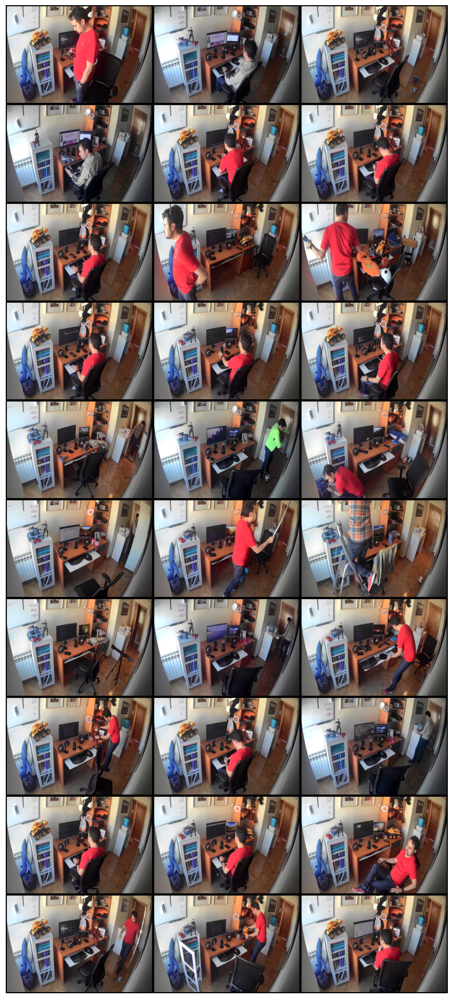

In [5]:
if not(CACHE_HIT):
    print("Preparing to convert from video to separated images:", INPUT_FILE)
    TARGET_HEIGHT, TARGET_WIDTH, TARGET_CHANNELS = IMAGE_SIZE_HEIGHT//TILE_SHAPE[0], IMAGE_SIZE_WIDTH//TILE_SHAPE[1], 3
    list_RGB = np.empty((0, IMAGE_SIZE_HEIGHT, IMAGE_SIZE_WIDTH, TARGET_CHANNELS), dtype=np.uint8)  # Initialize an empty array correctly
    list_RGB_tiles = np.empty((0, TARGET_HEIGHT, TARGET_WIDTH, TARGET_CHANNELS), dtype=np.uint8)  # Initialize an empty array correctly
    count = 0
    SAMPLES = 3


    # Attempt to read the first frame to start the loop
    vidcap = cv2.VideoCapture(INPUT_FILE)
    success, image = vidcap.read()

    if success:
        # Get the total number of frames in the video
        total_frames = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Total number of frames in the video: {total_frames}")
    else:
        raise Exception("Failed to read the first frame of the video.")


    print(f"Video resolution: {image.shape[0]}x{image.shape[1]}px")
    print(f"Going to resize to: {IMAGE_SIZE_HEIGHT}x{IMAGE_SIZE_WIDTH}px")

    # Reading from video can't be paralelized
    for _ in tqdm(range(min(total_frames, MAX_FRAMES)), desc="Processing frames"):
        if not success:
            break  # Exit loop if no more frames are available

        image = image[64:,...] # remove header of image (usually the datetime)
        image = cv2.resize(image, (IMAGE_SIZE_WIDTH, IMAGE_SIZE_HEIGHT))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        list_RGB = np.append(list_RGB, [image], axis=0)

        # Try to read the next frame for the next iteration
        success, image = vidcap.read()


print(f"Extracted {len(list_RGB)} images from video:")
show_mosaic(list_RGB, mosaic_dims=(10, 3))

# 2. Split train/test
Saves test images for future, and proceed applying augmentation to training.

Spliting train/test...
Found 160 training images:


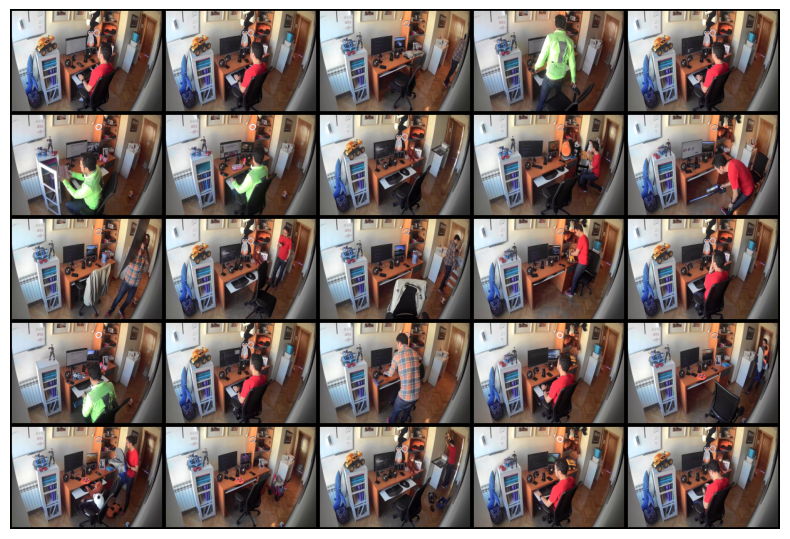

Found 40 testing images:


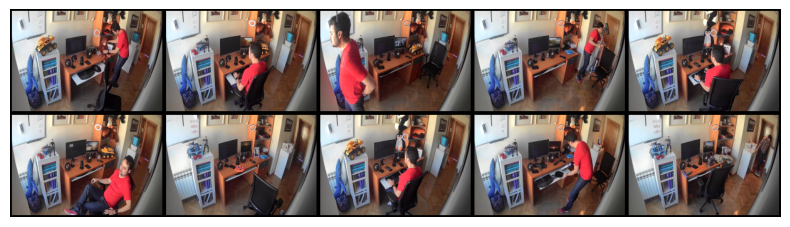

In [6]:
if not(CACHE_HIT):
    # Split the dataset into train and test sets
    print("Spliting train/test...")
    train_RGB, test_RGB = train_test_split(list_RGB, test_size=TEST_TRAIN_RATE, random_state=seed)

print(f"Found {len(train_RGB)} training images:")
show_mosaic(train_RGB, mosaic_dims=(5, 5))

print(f"Found {len(test_RGB)} testing images:")
show_mosaic(test_RGB, mosaic_dims=(2, 5))

# 3. Tiling images

In [7]:
def tile_image(image, tile_shape):
    """
    Tile a single image into smaller tiles of shape tile_shape.

    Args:
        image (np.ndarray): The image to tile, shape (h, w, channels).
        tile_shape (tuple): The shape of the tiles, (m, n).

    Returns:
        list of np.ndarray: The list of tiled images.
    """
    m, n = tile_shape
    img_h, img_w, channels = image.shape
    tile_h, tile_w = img_h // m, img_w // n

    tiles = [image[i*tile_h:(i+1)*tile_h, j*tile_w:(j+1)*tile_w, :]
             for i in range(m) for j in range(n)]
    return tiles

def tile_images(images, tile_shape):
    """
    Parallelize the tiling of each image in images.

    Args:
        images (list of np.ndarray): The list of images to tile.
        tile_shape (tuple): The shape of the tiles, (m, n).

    Returns:
        np.ndarray: All tiled images in the shape (num_images*m*n, tile_h, tile_w, channels).
    """
    # Flatten the list of lists of tiles into a single list of tiles
    with ThreadPoolExecutor() as executor:
        all_tiles = list(executor.map(lambda img: tile_image(img, tile_shape), images))
    
    # Flatten the list of lists into a single list
    all_tiles_flat = [tile for sublist in all_tiles for tile in sublist]
    
    # Stack all tiles into a single NumPy array
    return np.array(all_tiles_flat)

160 original imagens 1152x768px.


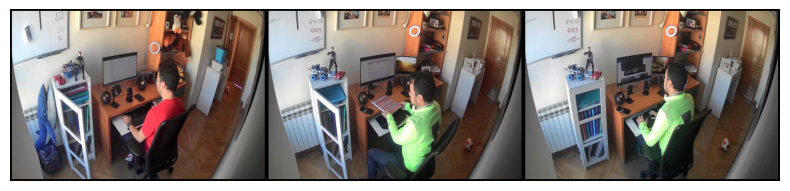

Tiled into 1280 patches.
Size after tiling: 768x1152px


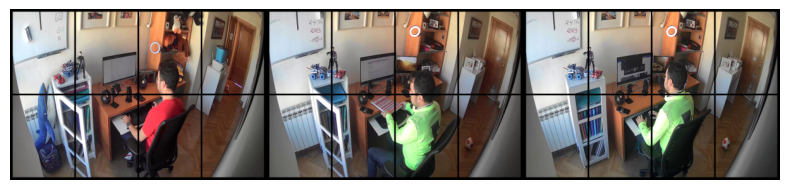

In [8]:
if not(CACHE_HIT):
    print(f"{len(train_RGB)} original imagens {IMAGE_SIZE_WIDTH}x{IMAGE_SIZE_HEIGHT}px.")
    show_mosaic(train_RGB[0:SAMPLES], mosaic_dims=(1, SAMPLES))

    train_RGB_tiles = tile_images(train_RGB, tile_shape=TILE_SHAPE)
    print(f"Tiled into {len(train_RGB_tiles)} patches.")

    # Update size after tiling
    TILE_SIZE_WIDTH, TILE_SIZE_HEIGHT, _ =  train_RGB[0].shape
    print(f"Size after tiling: {TILE_SIZE_WIDTH}x{TILE_SIZE_HEIGHT}px")

    images_mosaic=[]
    for i in range(0, SAMPLES*TILES_PER_IMAGE, TILES_PER_IMAGE):
        images_mosaic.append(build_mosaic(train_RGB_tiles[i:i+TILES_PER_IMAGE], mosaic_dims=(TILE_SHAPE[0], TILE_SHAPE[1])))

    show_mosaic(images_mosaic, mosaic_dims=(1, SAMPLES))

# 4. Removing Redundant Patches (Tiles)
This phase of the process might require a few minutes to complete; however, it plays a crucial role in enhancing the diversity of the training dataset. By eliminating similar patches (or tiles), it ensures that each image used for training offers a distinct set of features. This not only improves the robustness of the model but also significantly contributes to the overall accuracy by preventing overfitting to repetitive patterns.

In [9]:
def filter_similar_images(images_float_original, step=1, threshold=90, win_size=3, channel_axis=-1):
    """
    Filters out similar images from a list of images based on the SSIM score.

    Args:
        images: List of images as numpy arrays.
        threshold: Minimum SSIM score (scaled to 0-100) for which images are considered similar.
        win_size: Window size for SSIM calculation. Must be an odd number.
        channel_axis: Axis number corresponding to the color channels.

    Returns:
        filtered_images: List of filtered images where similar images are removed.
        similarity_scores: List of similarity scores for each image in the filtered list.
    """
    # Convert images to floating point for SSIM computation
    #Area Interpolation (cv2.INTER_AREA): This method is especially effective for image downscaling. It computes the average of all pixels that fall within the resizing window, resulting in a minimized moiré effect when the image is reduced. For upscaling, it's similar to the nearest-neighbor interpolation but with better quality.
    images_float = np.array([cv2.resize(img, (15, 15), interpolation=cv2.INTER_AREA) for img in images_float_original], dtype=np.float64)
    to_be_removed = []
    
    # Initialize an array to store the max SSIM score for each image
    max_similarity_scores = np.zeros(len(images_float))
    position = np.zeros(len(images_float), dtype=int)
    
    for i in tqdm(range(len(images_float))):
        img1 = images_float[i]
        if(i not in(to_be_removed)):
            # Adjust the range to compare at every X positions
            for j in range(i + step, len(images_float), step):
                position[i] = i % step
                if j < len(images_float):  # Ensure j is within the range
                    img2 = images_float[j]
                    score = ssim(img1, img2, multichannel=True, win_size=win_size, channel_axis=channel_axis, data_range=img1.max() - img1.min())
                    scaled_score = score * 100
                    max_similarity_scores[i] = max(max_similarity_scores[i], scaled_score)
                    if scaled_score > threshold:
                        to_be_removed.append(j)
                        #print(f"Removing {j} because it is similar to {i} with score {scaled_score}")
        #else:
            #print(f"Skipping {i} because it was removed")


    # Pair each image and score with its original index
    indexed_paired_images_scores = list(zip(images_float_original, max_similarity_scores, position))

    # Sort the paired list by position
    indexed_paired_images_scores_sorted = sorted(indexed_paired_images_scores, key=lambda x: (x[2]*1000+x[1])) #2=position   1=score

    # Filter images based on the threshold
    filtered_images = [x[0] #1=image
                       for i, x in enumerate(indexed_paired_images_scores_sorted) 
                       if i not in(to_be_removed)] # 1=score

    return np.array(filtered_images)

Excluding similar patches...


100%|██████████| 1280/1280 [00:38<00:00, 33.33it/s] 


Reduced from 1280 to 508 patches. 60.3125% less


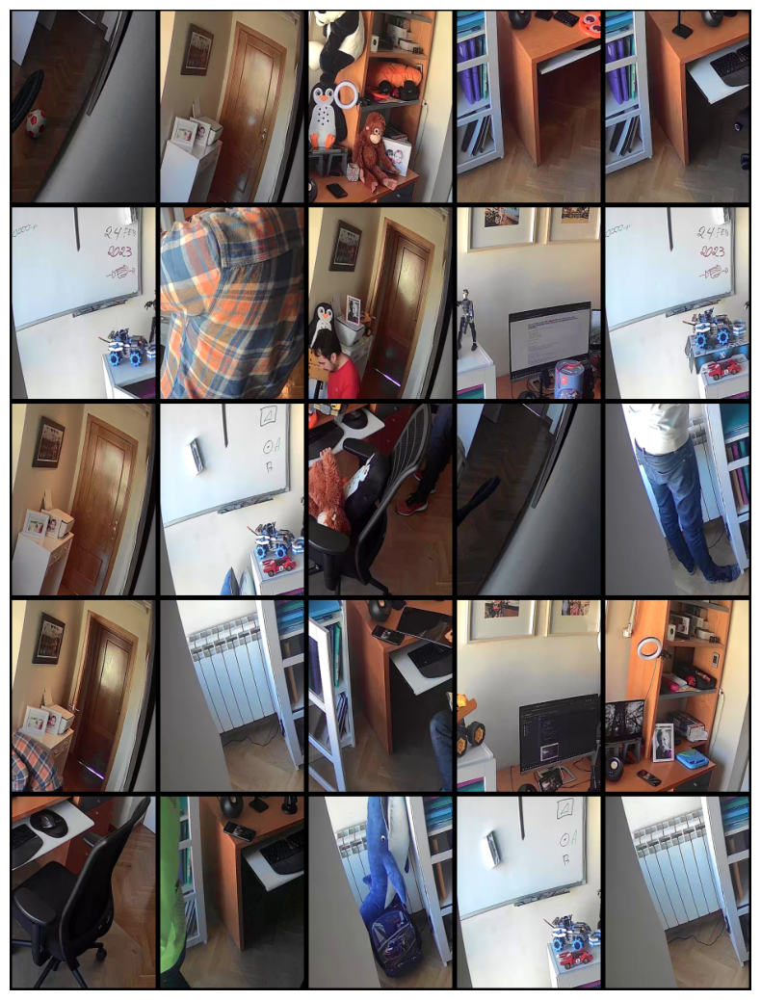

In [10]:
if not(CACHE_HIT):
    print(f"Excluding similar patches...")
    train_RGB_tiles_distinct = filter_similar_images(train_RGB_tiles, step=TILES_PER_IMAGE, threshold=SIMILARITY_THRESHOLD)
    print(f"Reduced from {len(train_RGB_tiles)} to {len(train_RGB_tiles_distinct)} patches. {(1-len(train_RGB_tiles_distinct)/len(train_RGB_tiles))*100}% less")

    show_mosaic(train_RGB_tiles_distinct, mosaic_dims=(5, 5))

# 5. Adding patches from random locations
Particularly good to train objects that appears in different parts of the image (people, toys...)<br/>
There is no need for exclude similar patches because location is already random.

In [11]:
def extract_random_tile(args):
    """
    Extracts a sub-box from a single image.
    This helper function is designed to be used with concurrent.futures.
    
    Args:
        args: A tuple containing:
            - image: A single image as a numpy array.
            - height: New height for the sub-box.
            - width: New width for the sub-box.
    
    Returns:
        A numpy array representing the sub-box extracted from the image.
    """
    image, new_height, new_width = args
    height, width, _ = image.shape
    start_y = np.random.randint(0, height - new_height)
    start_x = np.random.randint(0, width - new_width)
    return image[start_y:start_y+new_height, start_x:start_x+new_width, :]

def extract_random_tiles(images, factor=(2, 2)):
    """
    Extracts a sub-box from each image in a list of images using parallel processing.
    The sub-box is randomly located within the original image.

    Args:
        images: Numpy array of images with shape (num_images, height, width, channels).
        factor: Tuple of (height_factor, width_factor) determining the size of the sub-box
                relative to the original image size.

    Returns:
        A numpy array of sub-boxes with shape (num_images, new_height, new_width, channels).
    """
    num_images, height, width, channels = images.shape
    new_height, new_width = height // factor[0], width // factor[1]

    args = [(images[i], new_height, new_width) for i in range(num_images)]
    
    with ThreadPoolExecutor() as executor:
        output_images = list(executor.map(extract_random_tile, args))
    
    return np.array(output_images)

Adding 480 random tiles (3 per original image).
Total patches increased to 988


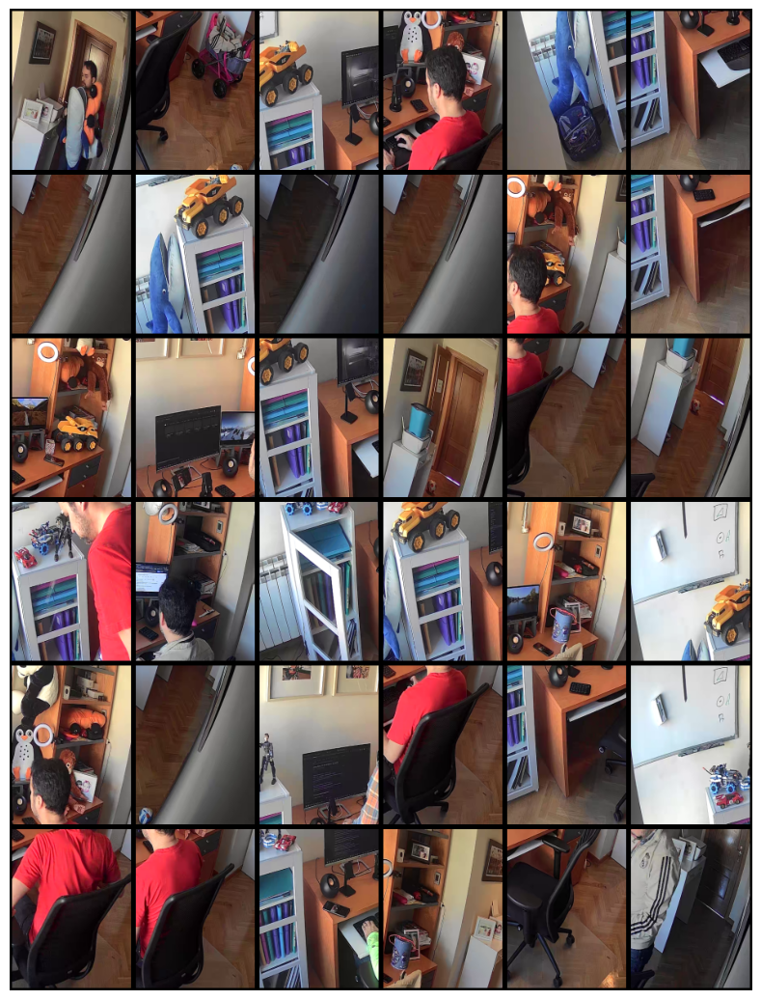

In [12]:
if not(CACHE_HIT):
    print(f"Adding {NUM_RANDOM_TILES*len(train_RGB)} random tiles ({NUM_RANDOM_TILES} per original image).")
    for i in range(NUM_RANDOM_TILES):
        train_RGB_tiles_distinct = np.append(train_RGB_tiles_distinct, extract_random_tiles(train_RGB, TILE_SHAPE), axis=0)

    print(f"Total patches increased to {len(train_RGB_tiles_distinct)}")

    show_mosaic(train_RGB_tiles_distinct, mosaic_dims=(6, 6))

# 6. Augmentation

Apply augmentation to train images only.<br/>

<p>The augmentation techniques enhances the diversity of the training dataset, aiming to improve the model's generalization capabilities:</p>

<ul>
    <li><strong>Rotation (20 degrees):</strong> Random rotations within the range of -20 to 20 degrees introduce rotational variance, teaching the model to recognize objects across different orientations.</li>
    <li><strong>Shear (20%):</strong> Shear transformations slant images, mimicking changes in perspective or object tilt.</li>
    <li><strong>Zoom (20%):</strong> Random zooming by up to 20% helps the model learn from various object sizes and scales.</li>
    <li><strong>Horizontal Flip:</strong> Random horizontal flips negate left-right orientation dependence, beneficial for orientation-invariant recognition tasks.</li>
    <li><strong>Fill Mode ('nearest'):</strong> Specifies the strategy for filling in new pixels created by transformations, using the nearest border pixels.</li>
</ul>

<p>By training on images subjected to these augmentations, the model becomes adept at handling a wide range of visual variations, thereby enhancing its ability to accurately interpret unseen images.</p>

In [13]:
def apply_augmentation(list_images):
    # Define your augmentation strategy
    # This is a basic example; adjust according to your needs
    data_gen_args = dict(
        rotation_range=5,  # Random rotations from - to + degrees
        #width_shift_range=0.5,  # Fraction of total width for horizontal shifts
        #height_shift_range=0.5,  # Fraction of total height for vertical shifts
        shear_range=10,  # Shear angle in counter-clockwise direction
        zoom_range=0.2,  # Random zoom
        #horizontal_flip=True,  # Randomly flip inputs horizontally
        fill_mode='wrap'  # Strategy for filling in newly created pixels
    )

    # Initialize the ImageDataGenerator with your specified augmentations
    image_datagen = ImageDataGenerator(**data_gen_args)
    
    augmented_images = []
    
    # Function to augment a single image
    def augment_image(image):
        # Adding the batch dimension by expanding dimensions
        image = np.expand_dims(image, axis=0)
        # Create a flow iterator for the single image
        it = image_datagen.flow(image, batch_size=1)
        # Retrieve the next image from the iterator (i.e., the augmented image)
        augmented_image = next(it)[0].astype(np.uint8)
        return augmented_image
    
    # Use ThreadPoolExecutor to parallelize the augmentation
    with ThreadPoolExecutor() as executor:
        # Map the augment_image function to each image in the list
        augmented_images = list(executor.map(augment_image, list_images))
    
    # Convert the list of augmented images back to a NumPy array
    return np.array(augmented_images)

Making Augmentation on training dataset only...
Generated 160 augmented images.


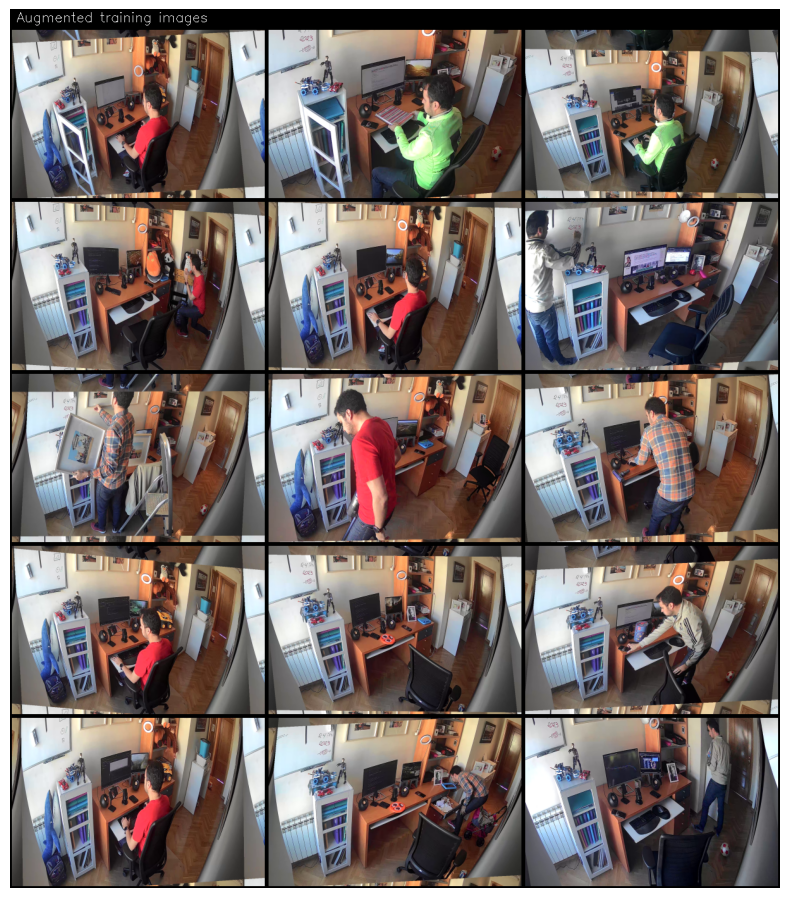

In [14]:
if not(CACHE_HIT):
    print("Making Augmentation on training dataset only...")
    train_RGB_augmented = apply_augmentation(train_RGB)

    print(f"Generated {len(train_RGB_augmented)} augmented images.")

    show_mosaic(train_RGB_augmented[0:SAMPLES*5], 
                titles=["Augmented training images"],
                mosaic_dims=(5, SAMPLES))

Adding 480 random tiles (3 per agumented image).


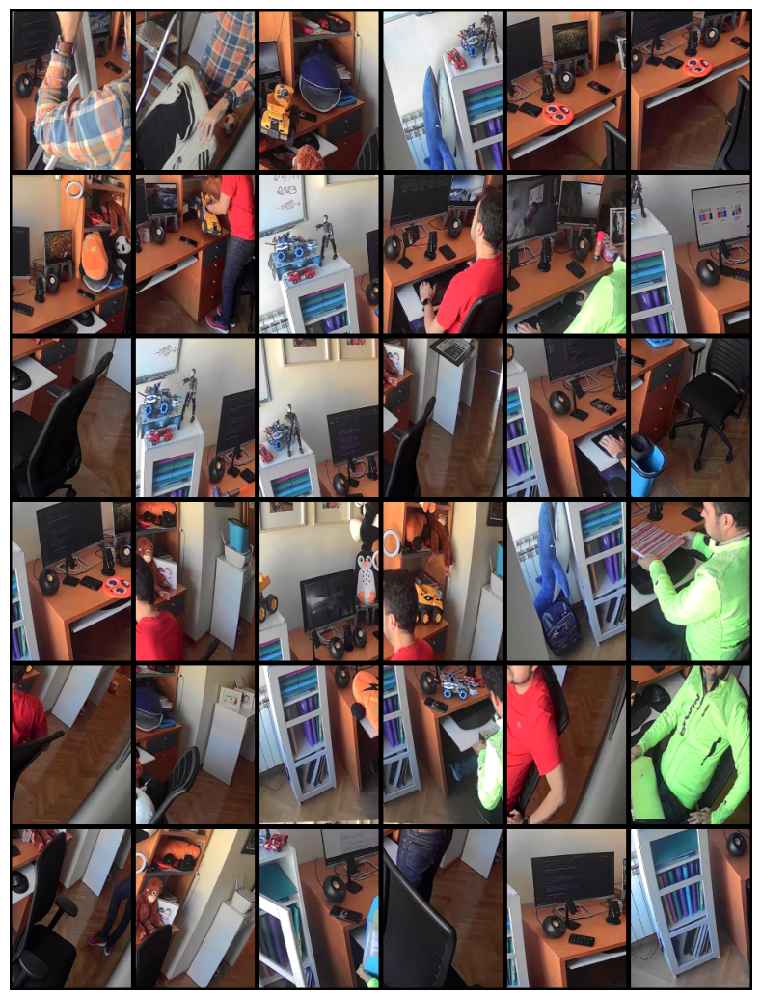

In [15]:
if not(CACHE_HIT):
    print(f"Adding {NUM_RANDOM_TILES*len(train_RGB_augmented)} random tiles ({NUM_RANDOM_TILES} per agumented image).")
    shape_tile = (0, train_RGB_tiles[0].shape[0], train_RGB_tiles[0].shape[1], train_RGB_tiles[0].shape[2])
    train_RGB_augmented_tiles = np.empty(shape_tile, dtype=np.uint8)

    for i in range(NUM_RANDOM_TILES):
        train_RGB_augmented_tiles = np.append(train_RGB_augmented_tiles, extract_random_tiles(train_RGB_augmented, TILE_SHAPE), axis=0)

    if len(train_RGB_augmented_tiles) > 0:
        show_mosaic(train_RGB_augmented_tiles, mosaic_dims=(6, 6))

Total patches increased to: 1468


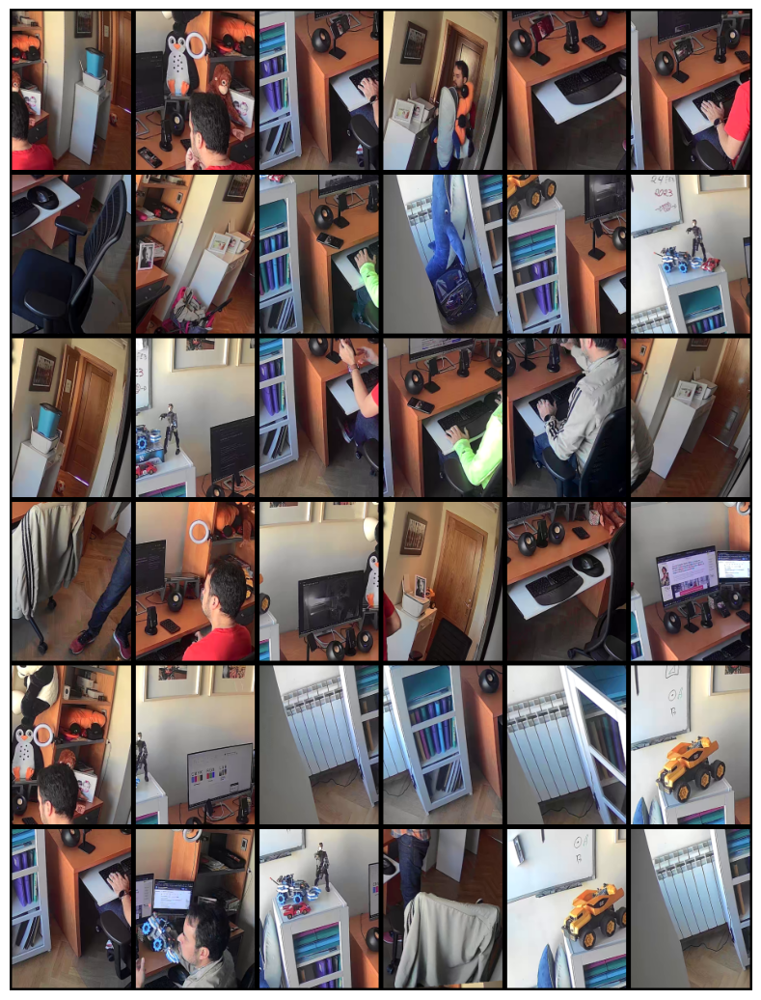

In [16]:
if not(CACHE_HIT):
    train_RGB_tiles_distinct = np.append(train_RGB_tiles_distinct, train_RGB_augmented_tiles, axis=0)
    print(f"Total patches increased to: {len(train_RGB_tiles_distinct)}")
    show_mosaic(train_RGB_tiles_distinct, mosaic_dims=(6, 6))

# 7. Separating input/output channels

# 7.1. Converting Color Space to LAB (channel A1)

In [17]:
#ABC is the internal format used by CNN where:
# A: input channel [0, 1]
# BC: output channel (predicted) [-1, 1]

method_convert_from_RGB = rgb2lab
method_convert_to_RGB = lab2rgb
input_channels = [0]
output_channels = [1,2]

def convert_from_RGB_normal_list(img_list):
    """
    Converts a list of RGB images to ABC format suitable for CNN processing.
    
    Args:
        img_list: List of RGB images.
        
    Returns:
        A_list: List of input channels.
        BC_list: List of output channels
    """
    with ThreadPoolExecutor() as e:
        # Convert each image in the list from RGB to ABC
        ABC = np.array(list(e.map(method_convert_from_RGB, img_list)), dtype=np.float32)

    A_list = ABC[..., input_channels] 
    BC_list = ABC[..., output_channels]
    
    # Normalize
    A_list /= 100.0
    BC_list /= 64.0

    # Apply transformation to A_list to improve contrast
    A_transformed_list = apply_clahe_to_image_list(A_list*255.0)/255.0
    
    A_return = np.concatenate((A_list, A_transformed_list), axis=-1)

    return A_return, BC_list

def convert_to_RGB_normal_list(A, BC):
    """
    Converts CNN output format back to RGB.
    
    Args:
        A_list: Input channels.
        BC_list: Output channels
        
    Returns:
        RGB: The RGB representation of the image.
    """
    # Denormalize
    A = np.array(A, dtype=np.float32)*100.0
    A = A[..., np.newaxis]
    BC = np.array(BC, dtype=np.float32)*64.0

    # Combine A and scaled BC channels and convert ABC to RGB
    ABC = np.concatenate((A, BC), axis=-1)

    with ThreadPoolExecutor() as e:
        # Convert each image in the list from RGB to ABC
        RGB = np.array(list(e.map(method_convert_to_RGB, ABC)), dtype=np.float32)
    
    RGB = np.array(RGB*255, dtype=np.uint8)

    return RGB


def convert_to_RGB_normal(A, BC):
    return convert_to_RGB_normal_list([A], [BC])[0]



def convert_from_RGB_normal_list(img_list):
    """
    Converts a list of RGB images to ABC format suitable for CNN processing.
    
    Args:
        img_list: List of RGB images.
        
    Returns:
        A_list: List of input channels.
        BC_list: List of output channels
    """
    with ThreadPoolExecutor() as e:
        # Convert each image in the list from RGB to ABC
        ABC = np.array(list(e.map(method_convert_from_RGB, img_list)), dtype=np.float32)

    A_list = ABC[..., input_channels] 
    BC_list = ABC[..., output_channels]
    
    # Normalize
    A_list /= 100.0
    BC_list /= 64.0

    # Apply transformation to A_list to improve contrast
    A_transformed_list = apply_clahe_to_image_list(A_list*255.0)/255.0
    
    A_return = np.concatenate((A_list, A_transformed_list), axis=-1)

    return A_return, BC_list

def convert_from_RGB_normal(img):
    A, BC = convert_from_RGB_normal_list([img])
    
    return A[0], BC[0]

In [18]:
if not(CACHE_HIT):
    print("Converting to ABC...")
    train_RGB = train_RGB_tiles_distinct
    train_X, train_Y = convert_from_RGB_normal_list(train_RGB)
    test_X, test_Y = convert_from_RGB_normal_list(test_RGB)
    print(f"Train_X: {train_X.shape} Train_Y: {train_Y.shape}")
    print(f"Test_X: {test_X.shape} Test_Y: {test_Y.shape}")

Converting to ABC...
Train_X: (1468, 384, 288, 2) Train_Y: (1468, 384, 288, 2)
Test_X: (40, 768, 1152, 2) Test_Y: (40, 768, 1152, 2)


In [19]:
if not(CACHE_HIT):
    # Save all processed data to disk for next execution
    saved_data = [train_X, test_X, train_Y, test_Y, train_RGB, test_RGB, list_RGB]
    print("Saving data to local cache:", PICKLE_CACHE)
    save_object(saved_data, PICKLE_CACHE)

Saving data to local cache: /kaggle/working/cache.pkl


# 7.2. CLAHE Transformation (channel A2)

Here we showcase an example featuring an original image, accompanied by its grayscale version derived from the L channel of the LAB color space. Additionally, we present a version of this grayscale image enhanced using the CLAHE method to boost contrast. Lastly, we display the result of combining the RGB channels with the contrast-enhanced grayscale.

The CNN is trained using both grayscale variations to capture both global and local features effectively.

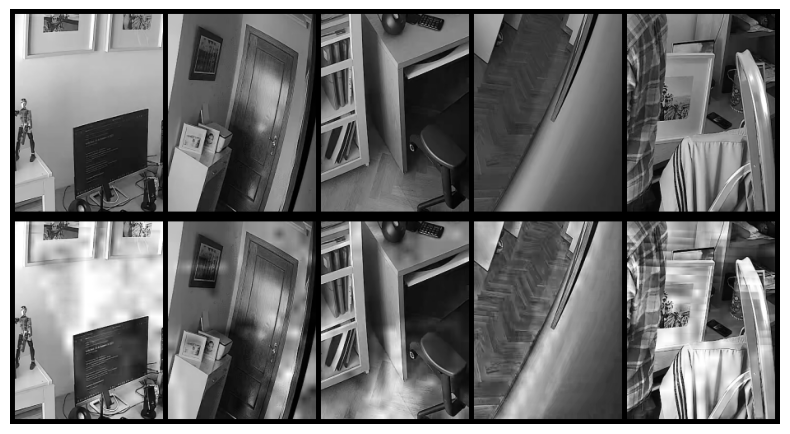

In [20]:
num_images = 5
random_image_indices = np.random.choice(train_X.shape[0], size=min(len(train_X), num_images), replace=False)

A, BC = train_X[random_image_indices], train_Y[random_image_indices]
A_transformed = A[..., 1]*255
A_original = A[..., 0]*255
show_mosaic([build_mosaic(A_original, mosaic_dims=(1, num_images)),
             build_mosaic(A_transformed, mosaic_dims=(1, num_images))],
            mosaic_dims=(2, 1))

# Sample video

In [21]:
train_sample_filename = r"train_sample.mp4"
test_sample_filename = r"test_sample.mp4"

save_video(input_images=train_RGB[:DISPLAY_SAMPLE], filename=train_sample_filename, fps=3.0)
save_video(input_images=test_RGB[:DISPLAY_SAMPLE], filename=test_sample_filename, fps=3.0)

show_videos(train_sample_filename)
show_videos(test_sample_filename)

<h1>CNN Model for Image Colorization</h1>

<h2>Training:</h2>
<p>Training is managed by a custom function, utilizing early stopping to prevent overfitting and using a specified batch size and number of epoch. The training process involves:</p>
<ul>
    <li>Using provided datasets for training and validation.</li>
    <li>Employing an Early Stopping Callback to halt training based on validation accuracy improvements and a specified patience parameter.</li>
</ul>

## EarlyStopping

EarlyStopping callback to monitor validation accuracy and stop training early if it plateaus

In [22]:
es_callback = callbacks.EarlyStopping(
    monitor='val_acc',
    patience=PATIENCE,
    verbose=1)

## Model

<h2>Model Architecture:</h2>
<ul>
<li><strong>Input Layer:</strong> Accepts images with any size (multiple of 32) and any number of channels, in this case 2 channels: the original grayscale and after applying CLAHE.</li>
<li><strong>Convolutional Layers (Conv2D):</strong> Multiple layers with an kernel size of (4, 4) and varying filter counts (8 to 256) extract features. Strides of 2 are used in some layers for downsampling.</li>
<li><strong>Activation Functions:</strong> ReLU is used for non-linear feature learning, with the final layer employing a tanh activation suitable for the A and B channels' output range.</li>
<li><strong>UpSampling2D Layers:</strong> Scale up the feature maps to match the original image dimensions, crucial for reconstructing the color channels at full resolution.</li>
<li><strong>Output Layer:</strong> Predicts the A and B channels with 2 filters, using tanh activation to ensure the output values are appropriately scaled.</li>
</ul>

<h2>Compilation:</h2>
<ul>
    <li><strong>Optimizer:</strong> Adam, for adaptive learning rate adjustments.</li>
    <li><strong>Loss Function:</strong> Mean Squared Error (mse), a standard choice for regression tasks like color channel prediction.</li>
    <li><strong>Metrics:</strong> Accuracy is monitored, although perceptual quality assessments may also be relevant for colorization.</li>
</ul>

In [23]:
def model_a():
    """
    Constructs a convolutional neural network model tailored for image colorization.
    
    Returns:
        A compiled Keras model ready for training.
    """
    kernel_size = (4, 4)  # Size of the convolutional window
    strides = 2  # Shift the convolutional window by X pixels across the image
    factor_up = (2, 2)  # Scale factor for upsampling

    model = Sequential()
    model.add(InputLayer(input_shape=train_X[0].shape))

    # Convolutional layers with relu activation and specified strides for downsampling
    model.add(Conv2D(8, kernel_size, activation='relu', padding='same', strides=strides))
    model.add(Conv2D(8, kernel_size, kernel_initializer=RandomNormal(mean=0.5, stddev=0.2), activation='relu', padding='same'))
    model.add(Conv2D(16, kernel_size, kernel_initializer=RandomNormal(mean=0.5, stddev=0.2), activation='relu', padding='same'))
    model.add(Conv2D(16, kernel_size, activation='relu', padding='same', strides=strides))
    # Continue adding layers, increasing the depth while reducing spatial dimensions
    model.add(Conv2D(32, kernel_size, activation='relu', padding='same'))
    model.add(Conv2D(32, kernel_size, activation='relu', padding='same', strides=strides))
    model.add(Conv2D(64, kernel_size, activation='relu', padding='same'))
    model.add(Conv2D(64, kernel_size, activation='relu', padding='same', strides=strides))
    model.add(Conv2D(128, kernel_size, activation='relu', padding='same'))
    model.add(Conv2D(128, kernel_size, activation='relu', padding='same', strides=strides))
    model.add(Conv2D(256, kernel_size, activation='relu', padding='same'))
    # Upsampling layers to restore original image size
    model.add(UpSampling2D(factor_up))
    model.add(Conv2D(256, kernel_size, activation='relu', padding='same'))
    model.add(Conv2D(128, kernel_size, activation='relu', padding='same'))
    model.add(UpSampling2D(factor_up))
    model.add(Conv2D(64, kernel_size, activation='relu', padding='same'))
    model.add(UpSampling2D(factor_up))
    model.add(Conv2D(32, kernel_size, activation='relu', padding='same'))
    model.add(UpSampling2D(factor_up))
    model.add(Conv2D(16, kernel_size, activation='relu', padding='same'))
    model.add(UpSampling2D(factor_up))
    # Final layer with tanh activation for output
    model.add(Conv2D(2, kernel_size, activation='tanh', padding='same')) #LAB
    
    model.compile(optimizer='Adam', loss='mse', metrics=['accuracy'])
    model.summary()

    return model

model = model_a()  # This will also show the model summary due to model.summary() call in model_a

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 192, 144, 8)       264       
                                                                 
 conv2d_1 (Conv2D)           (None, 192, 144, 8)       1032      
                                                                 
 conv2d_2 (Conv2D)           (None, 192, 144, 16)      2064      
                                                                 
 conv2d_3 (Conv2D)           (None, 96, 72, 16)        4112      
                                                                 
 conv2d_4 (Conv2D)           (None, 96, 72, 32)        8224      
                                                                 
 conv2d_5 (Conv2D)           (None, 48, 36, 32)        16416     
                                                                 
 conv2d_6 (Conv2D)           (None, 48, 36, 64)        3

# Training

In [24]:
def train_cnn(model, X, Y, batch_size=5):
    """
    Trains the CNN model with the given training and validation data.
    
    Args:
        model: The compiled Keras model to train.
        batch_size: Number of samples per gradient update.
        
    Returns:
        A history object containing the training history metrics.
    """

    X_train, X_valid, Y_train, Y_valid = train_test_split(X, Y, test_size=TEST_TRAIN_RATE, random_state=seed)

    # Train the model
    history = model.fit(
        X_train, Y_train,
        batch_size=batch_size,  
        epochs=EPOCHS,
        callbacks=[es_callback],
        validation_data=(X_valid, Y_valid),
        shuffle=True
    )

    return history

In [25]:
# Calculates ideal batch size, based on number of images, between a minimum of 5 and maximum of 50
# This is important to make sure the CNN will learn
BATCH_SIZE = min(200, max(5, len(train_X)//8))
print(f"Training with {len(train_X)} images ({train_X[0].shape[0]}x{train_X[0].shape[1]}px).")
print(f"Original {len(list_RGB)} images, size ({IMAGE_SIZE_HEIGHT}x{IMAGE_SIZE_WIDTH}px), tile shape {TILE_SHAPE}.")
print(f"Epochs={EPOCHS}   Patience={PATIENCE}   Batch size={BATCH_SIZE}")

Training with 1468 images (384x288px).
Original 200 images, size (768x1152px), tile shape (2, 4).
Epochs=150   Patience=30   Batch size=183


In [ ]:
history = train_cnn(model, train_X, train_Y, batch_size=BATCH_SIZE)

Train on 1174 samples, validate on 294 samples
Epoch 1/150
1174/1174 [==============================] - ETA: 0s - loss: 0.5592 - acc: 0.4802

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


1174/1174 [==============================] - 49s 42ms/sample - loss: 0.5592 - acc: 0.4802 - val_loss: 0.0478 - val_acc: 0.4437
Epoch 2/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0473 - acc: 0.4453 - val_loss: 0.0456 - val_acc: 0.4441
Epoch 3/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0446 - acc: 0.4452 - val_loss: 0.0451 - val_acc: 0.4442
Epoch 4/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0447 - acc: 0.4455 - val_loss: 0.0448 - val_acc: 0.4443
Epoch 5/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0441 - acc: 0.4463 - val_loss: 0.0437 - val_acc: 0.4444
Epoch 6/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0422 - acc: 0.4471 - val_loss: 0.0422 - val_acc: 0.4468
Epoch 7/150
1174/1174 [==============================] - 9s 7ms/sample - loss: 0.0410 - acc: 0.4665 - val_loss: 0.0412 - val_acc: 0.5571
Epoch 8/150
1174/1174 [============================

# Training Charts

In [ ]:
# Display training chart
show_loss_accuracy_evolution(pd.DataFrame(history.history))

# Predictions (images)

In the prediction phase, we employ images that the Convolutional Neural Network (CNN) has never encountered before. These images were set aside at the beginning of the process to ensure the integrity and effectiveness of the model's evaluation. Additionally, for the training of the CNN, a separate subset of the data was allocated exclusively for validation purposes. This validation set is distinct from the subset discussed herein, further supporting a robust training and evaluation framework.

In [ ]:
# Predict colorization for a list of images
def predict_images(X_list):
    """
    Predicts colorization of a list of grayscale images and returns frames for a video.
    
    Args:
        X_list: List of original images (for Luminance channel and Transformed).
    
    Returns:
        A numpy array of images (frames) for creating a video.
    """
    list_frames_gray, list_frames_color = [], [],

    X_list = tile_images(X_list, TILE_SHAPE)

    for i in tqdm(range(len(X_list))):
        # Ground truth and input images setup
        X_valid = X_list[i]
        X_valid_original = X_valid[...,0]
        X_valid_transformed = X_valid[...,1:1]# Pre-processed (e.g., CLAHE)

        # Predict colorization using the pre-processed image
        Y_predicted = model.predict(X_valid[np.newaxis, ...], verbose=0)[0]

        # Create a montage of original and predicted images
        img_1 = convert_to_RGB_normal(X_valid_original, Y_predicted*0) #grayscale
        img_2 = convert_to_RGB_normal(X_valid_original, Y_predicted)
        
        list_frames_gray.append(img_1)
        list_frames_color.append(img_2)

    return list_frames_gray, list_frames_color

In [ ]:
# Result Test images
num_predictions = min(8, len(test_X))
video_frames = []
for i in range(num_predictions):
    print(f"Predicting image {i}/{num_predictions}:")
    list_frames_gray, list_frames_color = predict_images(test_X[i:i+1])
    
    show_mosaic([build_mosaic(list_frames_gray[0:TILES_PER_IMAGE], mosaic_dims=TILE_SHAPE),
                 build_mosaic(list_frames_color[0:TILES_PER_IMAGE], mosaic_dims=TILE_SHAPE)],
                mosaic_dims=(1,2))


# Predictions (video)

In [ ]:
print("Predicting all test images...")
filename = MODEL_NAME + "_test.mp4"
list_frames_video = []
list_frames_gray, list_frames_color = predict_images(test_X)

print("Preparing video...")
for i in tqdm(range(len(list_frames_color)//TILES_PER_IMAGE)):
    list_frames_video.append(build_mosaic(list_frames_color[i*TILES_PER_IMAGE:(i+1)*TILES_PER_IMAGE], 
                                          mosaic_dims=TILE_SHAPE))

print("Saving video...")
save_video(list_frames_video, filename, fps=3.0)

In [ ]:
print("Showing video...")
show_videos(filename)

# Save model

For reuse in future.

In [ ]:
#@title Save model
#save model in universal format (better for share)
MODEL_PATH_NAME = f"{PATH_LOCAL}{MODEL_NAME}"
MODEL_SAVE=f"{MODEL_PATH_NAME}.save"
model.save(MODEL_SAVE)